# SCT - multi regressed - integration processing

---

In [1]:
%matplotlib widget

import warnings
warnings.filterwarnings('ignore')

import os, sys, json, operator, getpass, zlib
from pathlib import Path
from datetime import datetime

import numpy as np
import pandas as pd
import scanpy as sc

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

# to deal with those pesky non-persistent widget plots
import base64
from io import BytesIO
from IPython.display import HTML

In [2]:
with open('/.singularity.d/labels.json') as fh:
    singularity = json.load(fh)
    
singularity['Version']

'metztli.25h'

In [3]:
home = str(Path.home())
user = getpass.getuser()

basedir = os.path.join(home, 'databoard/users', user, '2021/BloodPaper/')

sc.settings.writedir = os.path.join(basedir, 'h5ad/')

In [4]:
sc.settings.verbosity = 3             # show some output
sc.settings.file_format_figs = 'svg'  # set this to 'svg' (notebook) or 'pdf' (files) if you want vector graphics
sc.settings.savefigs = False

In [5]:
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = 'Arial'
plt.rc('font', size=14)

In [6]:
"""
Allows to create a persistent png image from
the last plotted matplotlib plot widget
"""
def perma_plot():
    # TODO: maybe pass parameters for savefig
    #       to control quality/type of img
    buffer = BytesIO()
    plt.savefig(buffer, format='png')
    buffer.seek(0)
    
    encoded_string = base64.b64encode(buffer.read()).decode('utf-8')
    html_string = '<img src=\'data:image/png;base64,{}\'>'.format(encoded_string)
    
    return html_string

---

In [7]:
now = datetime.now()
prefix = now.strftime('%Y%m%d')
print(prefix)

20210913


In [8]:
%%time
integrated = sc.read( '20210913_COMBO10_Seurat_SCT_PRE_integration_regressions_processed' )

CPU times: user 1min 3s, sys: 9.98 s, total: 1min 13s
Wall time: 1min 45s


In [9]:
integrated

AnnData object with n_obs × n_vars = 116251 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'donor', 'library', 'organ', 'n_counts', 'n_counts_log', 'percent_mitoc', 'n_genes', 'nCount_SCT', 'nFeature_SCT', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'integrated_snn_res.0.8', 'seurat_clusters'
    var: 'features', 'SCT_features'
    uns: 'neighbors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'SCT'
    obsp: 'distances'

In [11]:
integrated.obs.drop(['orig.ident', 'old.ident', 'integrated_snn_res.0.8'], axis=1, inplace=True)
integrated

AnnData object with n_obs × n_vars = 116251 × 3000
    obs: 'nCount_RNA', 'nFeature_RNA', 'donor', 'library', 'organ', 'n_counts', 'n_counts_log', 'percent_mitoc', 'n_genes', 'nCount_SCT', 'nFeature_SCT', 'S.Score', 'G2M.Score', 'Phase', 'seurat_clusters'
    var: 'features', 'SCT_features'
    uns: 'neighbors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'SCT'
    obsp: 'distances'

In [14]:
integrated.obs.donor.unique()

['DOD1', 'DOD2', 'DOD3', 'DOD4', 'TQ198', 'BP62j', 'BP37d', 'BP74', 'BP1c', 'BP59h']
Categories (10, object): ['DOD1', 'DOD2', 'DOD3', 'DOD4', ..., 'BP37d', 'BP74', 'BP1c', 'BP59h']

---

### Transfer DR to log-norm object

---

In [17]:
source = os.path.join(home, 'databoard/users', user, '2020/SLX19841/analysis/h5ad/')

In [19]:
del integrated.raw

In [20]:
integrated

AnnData object with n_obs × n_vars = 116251 × 3000
    obs: 'nCount_RNA', 'nFeature_RNA', 'donor', 'library', 'organ', 'n_counts', 'n_counts_log', 'percent_mitoc', 'n_genes', 'nCount_SCT', 'nFeature_SCT', 'S.Score', 'G2M.Score', 'Phase', 'seurat_clusters'
    var: 'features', 'SCT_features'
    uns: 'neighbors', 'donor_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'SCT'
    obsp: 'distances'

#### Get all the original counts

---

In [24]:
%%time
counts = sc.read( os.path.join(source, '20201113_COMBO10_counts_doublet_filtered_BEFORE_per_cell_normalization') )

CPU times: user 15.5 s, sys: 2.09 s, total: 17.6 s
Wall time: 18.9 s


In [25]:
counts

AnnData object with n_obs × n_vars = 122857 × 24344
    obs: 'batch', 'donor', 'library', 'organ', 'n_counts', 'n_counts_log', 'percent_mitoc', 'n_genes'
    var: 'gene_ids', 'n_cells'
    layers: 'counts'

In [26]:
common = integrated.obs.index.intersection(counts.obs.index)

Get just the counts for the cells that intersect with the integrated object

In [28]:
combined = counts[common].copy()

In [29]:
combined

AnnData object with n_obs × n_vars = 116251 × 24344
    obs: 'batch', 'donor', 'library', 'organ', 'n_counts', 'n_counts_log', 'percent_mitoc', 'n_genes'
    var: 'gene_ids', 'n_cells'
    layers: 'counts'

In [30]:
# transfer DR from integrated data
combined.uns['donor_colors'] = integrated[combined.obs.index].uns['donor_colors'].copy()

combined.obsm['X_pca'] = integrated[combined.obs.index].obsm['X_pca'].copy()
combined.obsm['X_umap'] = integrated[combined.obs.index].obsm['X_umap'].copy()

Filter out zero expression-genes

In [31]:
nonzero = combined.X.sum(axis=0) > 0

nonzero = nonzero.tolist()[0]

In [34]:
combined = combined[: , nonzero].copy()

In [35]:
%%time
sc.pp.normalize_total(combined, target_sum=1e4, exclude_highly_expressed=True)

normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
['S100A9', 'S100A8', 'IL8', 'PPBP', 'TMSB4X', 'HBB', 'FTH1', 'NEAT1', 'MALAT1', 'FOS', 'MT2A', '7SK-2', 'AVP', 'FTL', 'IGLL5']
    finished (0:00:01)
CPU times: user 5.7 s, sys: 27.9 s, total: 33.6 s
Wall time: 1min 15s


In [36]:
sc.pp.log1p(combined, base=2)

In [37]:
combined.layers["lognorm"] = combined.X.copy()

In [38]:
%%time
sc.pp.highly_variable_genes(combined, 
                            min_mean=0.001, max_mean=5, min_disp=0.05)

extracting highly variable genes
    finished (0:00:07)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
CPU times: user 4.71 s, sys: 1.33 s, total: 6.03 s
Wall time: 7.95 s


In [41]:
sc.pp.neighbors(combined)

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:26)


#### Merge and transfer annotations between objects

---

In [42]:
meta_mix = integrated.obs.merge(combined.obs, left_index=True, right_index=True)

In [47]:
meta = meta_mix[['nCount_RNA', 'nFeature_RNA', 'donor_x', 'library_x', 'organ_x',
       'n_counts_x', 'n_counts_log_x', 'percent_mitoc_x', 'n_genes_x',
       'nCount_SCT', 'nFeature_SCT', 'S.Score', 'G2M.Score', 'Phase',
       'seurat_clusters']]


meta.columns = ['nCount_RNA', 'nFeature_RNA', 'donor', 'library', 'organ',
       'n_counts', 'n_counts_log', 'percent_mitoc', 'n_genes',
       'nCount_SCT', 'nFeature_SCT', 'S.Score', 'G2M.Score', 'Phase',
       'seurat_clusters']


**Insert adjusted merged metadata**

In [50]:
combined.obs = meta.copy()

In [51]:
combined.obs.head()

,nCount_RNA,nFeature_RNA,donor,library,organ,n_counts,n_counts_log,percent_mitoc,n_genes,nCount_SCT,nFeature_SCT,S.Score,G2M.Score,Phase,seurat_clusters
_01_AAACCTGCACGTCTCT.1.0,10052.0,2399,DOD1,SIGAD9,PB,10076.0,4.003288,0.027491,2408,9678.0,2399,-0.119648,-0.020986,G1,5
_01_AAACCTGGTGTGACGA.1.0,14884.0,3610,DOD1,SIGAD9,PB,14902.0,4.173245,0.030734,3614,10169.0,3500,0.428415,0.108699,S,13
_01_AAACCTGGTTCCGGCA.1.0,5547.0,1544,DOD1,SIGAD9,PB,5555.0,3.744684,0.042304,1547,8805.0,1578,-0.110166,-0.046986,G1,3
_01_AAACGGGGTCAAAGCG.1.0,4184.0,1159,DOD1,SIGAD9,PB,4187.0,3.621903,0.026033,1162,8847.0,1308,-0.047286,-0.048968,G1,13
_01_AAAGATGCACATGACT.1.0,12027.0,2548,DOD1,SIGAD9,PB,12052.0,4.081059,0.027215,2554,9986.0,2546,-0.108544,-0.034926,G1,3


---

### Leiden clustering

---

In [52]:
sc.tl.leiden(combined, resolution=0.6, key_added='leiden.0.6')

running Leiden clustering
    finished: found 16 clusters and added
    'leiden.0.6', the cluster labels (adata.obs, categorical) (0:01:08)


In [53]:
sc.tl.leiden(combined, resolution=0.7, key_added='leiden.0.7')

running Leiden clustering
    finished: found 17 clusters and added
    'leiden.0.7', the cluster labels (adata.obs, categorical) (0:00:56)


In [54]:
sc.tl.leiden(combined, resolution=0.8, key_added='leiden.0.8')

running Leiden clustering
    finished: found 18 clusters and added
    'leiden.0.8', the cluster labels (adata.obs, categorical) (0:01:02)


In [55]:
sc.tl.leiden(combined, resolution=0.9, key_added='leiden.0.9')

running Leiden clustering
    finished: found 20 clusters and added
    'leiden.0.9', the cluster labels (adata.obs, categorical) (0:00:56)


In [56]:
sc.tl.leiden(combined, resolution=1.0, key_added='leiden.1.0')

running Leiden clustering
    finished: found 20 clusters and added
    'leiden.1.0', the cluster labels (adata.obs, categorical) (0:01:52)


In [57]:
sc.tl.leiden(combined, resolution=1.1, key_added='leiden.1.1')

running Leiden clustering
    finished: found 24 clusters and added
    'leiden.1.1', the cluster labels (adata.obs, categorical) (0:01:04)


In [58]:
sc.tl.leiden(combined, resolution=1.2, key_added='leiden.1.2')

running Leiden clustering
    finished: found 25 clusters and added
    'leiden.1.2', the cluster labels (adata.obs, categorical) (0:01:13)


In [59]:
sc.tl.leiden(combined, resolution=1.3, key_added='leiden.1.3')

running Leiden clustering
    finished: found 27 clusters and added
    'leiden.1.3', the cluster labels (adata.obs, categorical) (0:01:29)


In [60]:
sc.tl.draw_graph(combined, n_jobs=8)

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:17:07)


In [66]:
basename = '_COMBO10_Seurat_SCT_norm_regressions_PRE_integration_lognorm_annot_DR_MERGED'

savename = prefix + basename
sc.write(savename, combined)

#### Retrieve and re-add doublet scores

---

In [89]:
path12 = '2019/EL_NM_01/data_intermediate/SLX_14831_12978_COMBO/'

temp = sc.read(os.path.join(path12, 
                   'SLX14831_12978_COMBO_filtered_gene_bc_expression_minus_365_putative_doublets_20190524') )

In [99]:
doublets_1 = temp[temp.obs.donor == 'D1'].obs[['donor', 'doublet_scores']].copy()

doublets_2 = temp[temp.obs.donor == 'D2'].obs[['donor', 'doublet_scores']].copy()

In [100]:
path34 = '2020/SLX19841/analysis/h5ad/'

temp = sc.read(os.path.join(path34,'20201016_SLX19841_DOD_filtered_gene_bc_expression_minus_1031_putative_doublets'))

In [101]:
doublets_3 = temp[np.logical_and(temp.obs['donor'] == 'KSP29', temp.obs['organ'] == 'BM'), :].obs[['donor', 'doublet_scores']].copy()

doublets_4 = temp[temp.obs.donor == 'KSP32'].obs[['donor', 'doublet_scores']].copy()

In [102]:
path345 = '2020/SLX18808/analysis/h5ad/'
temp = sc.read(os.path.join(path345, 
                               'SLX_18808_filtered_gene_bc_expression_minus_217_putative_doublets_20200203')
                 )

In [103]:
doublets_5 = temp[temp.obs.donor == 'TQ198'].obs[['donor', 'doublet_scores']].copy()

doublets_6 = temp[temp.obs.donor == 'BP62j'].obs[['donor', 'doublet_scores']].copy()

doublets_7 = temp[temp.obs.donor == 'BP37d'].obs[['donor', 'doublet_scores']].copy()

In [104]:
path8 = '2020/SLX19286/analysis/h5ad/'
temp = sc.read( os.path.join(path8, 
                                 'SLX_19286_filtered_gene_bc_expression_minus_487_putative_doublets_20200429') )

In [105]:
doublets_8 = temp[temp.obs.donor == 'BP74'].obs[['donor', 'doublet_scores']].copy()

In [106]:
temp = sc.read(os.path.join(path34,'20201015_SLX19841_LD_filtered_gene_bc_expression_minus_1045_putative_doublets'))

In [107]:
doublets_9 = temp[temp.obs.donor == 'BP1c'].obs[['donor', 'doublet_scores']].copy()

doublets_10 = temp[temp.obs.donor == 'BP59h'].obs[['donor', 'doublet_scores']].copy()

In [111]:
def adjust_index(df, prefix):

    index = []
    for x in df.index:
        x = x.replace('-', '.')
        x = prefix + x
        index.append(x)

    df.index = index

In [112]:
adjust_index(doublets_1, '_01_')
adjust_index(doublets_2, '_02_')

# to match with legacy labelling
adjust_index(doublets_3, '_3_')
adjust_index(doublets_3, '_03_')

adjust_index(doublets_4, '_04_')
adjust_index(doublets_5, '_05_')
adjust_index(doublets_6, '_06_')
adjust_index(doublets_7, '_07_')
adjust_index(doublets_8, '_08_')
adjust_index(doublets_9, '_09_')
adjust_index(doublets_10, '_10_')

In [117]:
doublets = pd.concat([doublets_1, doublets_2, doublets_3, doublets_4, doublets_5,
           doublets_6, doublets_7, doublets_8, doublets_9, doublets_10], axis=0)

In [124]:
combined.obs['doublet_scores'] = doublets.loc[combined.obs.index.intersection(doublets.index), :]['doublet_scores'].copy()

In [127]:
basename = '_COMBO10_Seurat_SCT_norm_regressions_PRE_integration_lognorm_annot_DR_MERGED'

savename = prefix + basename
sc.write(savename, combined)

In [129]:
sc.pl.umap(combined, color=['leiden.0.6', 'leiden.0.7', 'leiden.0.8', 
                           'leiden.0.9', 'leiden.1.0', 'leiden.1.1',
                           'leiden.1.2', 'leiden.1.3'], ncols=3, wspace=0.4 )

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …


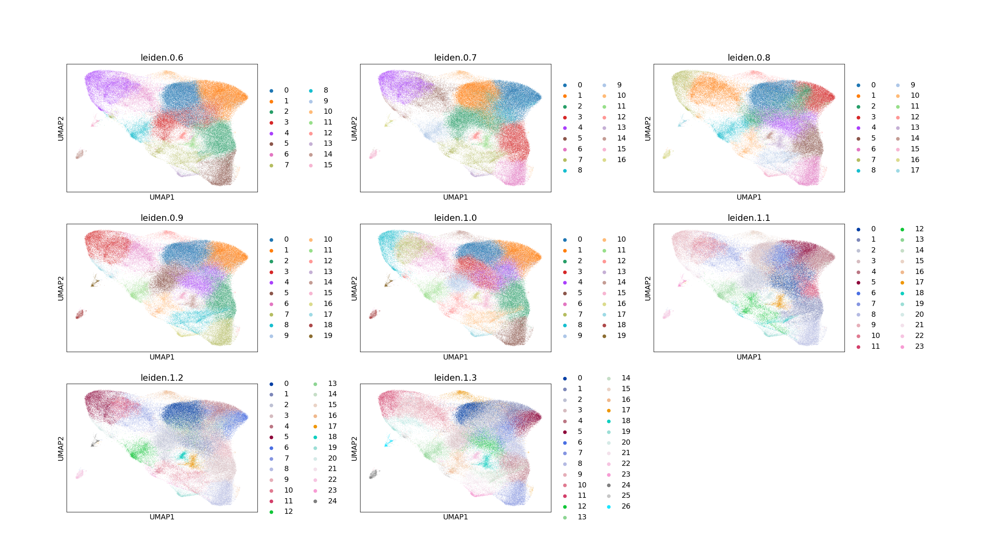

In [130]:
HTML(perma_plot())

## Clusters at resolution 0.7 were chosen to proceed

---

In [29]:
data = sc.read('20210913_COMBO10_Seurat_SCT_norm_regressions_PRE_integration_lognorm_annot_DR_MERGED')

In [31]:
output_path='./output/marker_genes/00/'

In [32]:
def save_dex_results(adata, key, grouping, basename, outpath):
    
    statcols =['gene_name', 'scores', 'logfoldchanges','pvals', 'pvals_adj' ]
    
    groups = adata.obs[grouping].unique()   
    n = adata.shape[1]
    
    marker_genes_full = {}   
    for g in groups:
        marker_genes = np.reshape( np.array(adata.uns[key]['names'][g]), (n,1) )
       
        marker_genes_full.setdefault(g, None )
        marker_genes_full[g] = np.reshape( np.array(adata.uns[key]['names'][g]), (n,1) )
        marker_genes_full[g] = np.concatenate( [marker_genes_full[g], 
                                                   np.reshape(adata.uns[key]['scores'][g], (n,1) ) ], axis=1)
        marker_genes_full[g] = np.concatenate( [marker_genes_full[g], 
                                                   np.reshape(adata.uns[key]['logfoldchanges'][g], (n,1) ) ], axis=1)
        marker_genes_full[g] = np.concatenate( [marker_genes_full[g], 
                                                   np.reshape(adata.uns[key]['pvals'][g], (n,1) ) ], axis=1)
        marker_genes_full[g] = np.concatenate( [marker_genes_full[g], 
                                                   np.reshape(adata.uns[key]['pvals_adj'][g], (n,1) ) ], axis=1)   

    for c in marker_genes_full.keys():
        temp = pd.DataFrame(marker_genes_full[c], columns=statcols)   
        temp.to_csv( os.path.join(outpath,  
                    prefix+basename+key+'_group_'+c+'.txt'), 
                    index=None, sep='\t')

In [33]:
def export_top_n_diff_genes(adata, key, groups, n, basename, outpath):
  
    marker_genes = np.reshape( np.array(adata.uns[key]['names'][groups[0]][:n]  ), (n,1) )

    for c in groups[1:]:
        marker_genes = np.concatenate( [marker_genes, np.reshape(adata.uns[key]['names'][c][:n], (n,1) ) ], axis=1)

    markers_frame = pd.DataFrame( marker_genes, columns=groups )

    markers_frame.to_csv(os.path.join(outpath,
                         prefix+basename+key+'_top'+str(n)+'_gene_markers.txt'), 
                         index=None, sep='\t')

In [34]:
def bundled_DEx_shenanigans(adata, group, key, bname, outpath, n_top_markers=100):
    
    # beware of hard-coded variables (backtracked also)
    
    sc.tl.rank_genes_groups(adata, 
                        groupby=group,
                        key_added=key,
                        method='wilcoxon', 
                        tie_correct=True,     
                        use_raw=False)
    
    save_dex_results(adata, key, group, bname, outpath)
    
    targets = adata.obs[group].unique()
    export_top_n_diff_genes(adata, key, targets, n_top_markers, bname, outpath)

In [36]:
basename = '_COMBO10_WRS_leiden_0_7_'

In [37]:
%%time
bundled_DEx_shenanigans(adata=data, 
                        group='leiden.0.7', 
                        key='DEx',
                        bname=basename, 
                        outpath=output_path,
                        n_top_markers=100)

CPU times: user 56min 11s, sys: 22min 48s, total: 1h 19min
Wall time: 1h 19min 12s


#### Excluding clusters 15 and 16

---

In [43]:
exclude = data[~data.obs['leiden.0.7'].isin(['15', '16']), :].obs.index.to_list()


In [44]:
with open('output/20210916_mature_cells_exclusions.txt', 'w') as fh:
    for e in exclude:
        fh.write(e+'\n')

In [45]:
keep = data[~data.obs['leiden.0.7'].isin(['15', '16']), :].obs.index.to_list()

with open('output/20210916_kept_cells_exclusions.txt', 'w') as fh:
    for k in keep:
        fh.write(k+'\n')

In [47]:
data = data[~data.obs['leiden.0.7'].isin(['15', '16']), :].copy()

In [48]:
data

AnnData object with n_obs × n_vars = 114763 × 24329
    obs: 'nCount_RNA', 'nFeature_RNA', 'donor', 'library', 'organ', 'n_counts', 'n_counts_log', 'percent_mitoc', 'n_genes', 'nCount_SCT', 'nFeature_SCT', 'S.Score', 'G2M.Score', 'Phase', 'seurat_clusters', 'leiden.0.6', 'leiden.0.7', 'leiden.0.8', 'leiden.0.9', 'leiden.1.0', 'leiden.1.1', 'leiden.1.2', 'leiden.1.3', 'doublet_scores'
    var: 'gene_ids', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'donor_colors', 'draw_graph', 'hvg', 'leiden', 'leiden.1.0_colors', 'log1p', 'neighbors', 'DEx'
    obsm: 'X_draw_graph_fa', 'X_pca', 'X_umap'
    layers: 'counts', 'lognorm'
    obsp: 'connectivities', 'distances'

In [50]:
sc.tl.umap(data)

In [52]:
%%time
sc.write('20210916_COMBO10_Seurat_SCT_norm_regressions_PRE_integration_lognorm_annot_DR_MERGED_SUBSET', data)

CPU times: user 2min 28s, sys: 5.63 s, total: 2min 34s
Wall time: 2min 33s


In [53]:
sc.pp.neighbors(data)

In [55]:
%%time
sc.tl.umap(data)

CPU times: user 2min 7s, sys: 858 ms, total: 2min 7s
Wall time: 2min 8s


## 1st Re-clustering

---

In [7]:
%%time
data = sc.read('20210916_COMBO10_Seurat_SCT_norm_regressions_PRE_integration_lognorm_annot_DR_MERGED_SUBSET')

CPU times: user 31.3 s, sys: 3.37 s, total: 34.6 s
Wall time: 42.6 s


In [9]:
sc.tl.leiden(data, resolution=1.0, key_added='rc_leiden.1.0')
sc.tl.leiden(data, resolution=1.1, key_added='rc_leiden.1.1')
sc.tl.leiden(data, resolution=1.2, key_added='rc_leiden.1.2')
sc.tl.leiden(data, resolution=1.3, key_added='rc_leiden.1.3')

In [10]:
sc.pl.umap(data, color='rc_leiden.1.0')
sc.pl.umap(data, color='rc_leiden.1.1')
sc.pl.umap(data, color='rc_leiden.1.2')
sc.pl.umap(data, color='rc_leiden.1.3')

In [17]:
def plot_segregated_field_plus(data, grouping, highlight, slot=None):

    '''
    grouping: field to segregate in each plot
    highlight: group to color in each of the plots
    '''
    
    
    n_groups = data.obs[grouping].nunique()
    n_rows = math.ceil(n_groups/4)
       
    fig,ax = plt.subplots(n_rows, 4,  
                          squeeze=True, 
                          sharex=True, 
                          sharey=True, 
                          figsize=( 16.5, (n_rows*4)+0.5 )
                         )
    fig.tight_layout()
    ax = ax.ravel()
    print(len(ax))
    i = 0

    groups_sorted = natsort.natsorted( data.obs[grouping].unique() ) # [ str(x) for x in range(0, n_groups) ]

    for g in groups_sorted:
    #for g in set(data.obs['louvain']):
        try:
            
            if slot is not None:
                sc.pl.scatter(data, basis=slot, ax=ax[i])
                sc.pl.scatter(data[data.obs[grouping] == g, :], basis=slot , color=[highlight], ax=ax[i], 
                                                                 title=g) #, legend_loc=None)#, title=g)
            else:
                sc.pl.umap(data, ax=ax[i])
                sc.pl.umap(data[data.obs[grouping] == g, :], color=[highlight], ax=ax[i], 
                                                                 title=g, legend_loc=None)#, title=g)
                
            ax[i].collections[1].set_sizes([50])
            #ax[i].set_xlim((-20,40))
            #ax[i].set_ylim((-20,40))
            ax[i].get_xaxis().set_visible(False)
            ax[i].get_yaxis().set_visible(False)
            i += 1
        except IndexError:
            pass

    fig.text(0.5, 0.01, 'UMAP1', ha='center', va='center')
    fig.text(0.025, 0.5, 'UMAP2', ha='center', va='center', rotation=90)
    fig.suptitle(grouping)

---

### Resolution 1.3 was chosen for the new clusters

In [27]:
plot_segregated_field_plus(data, 'rc_leiden.1.3', 'rc_leiden.1.3')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

24



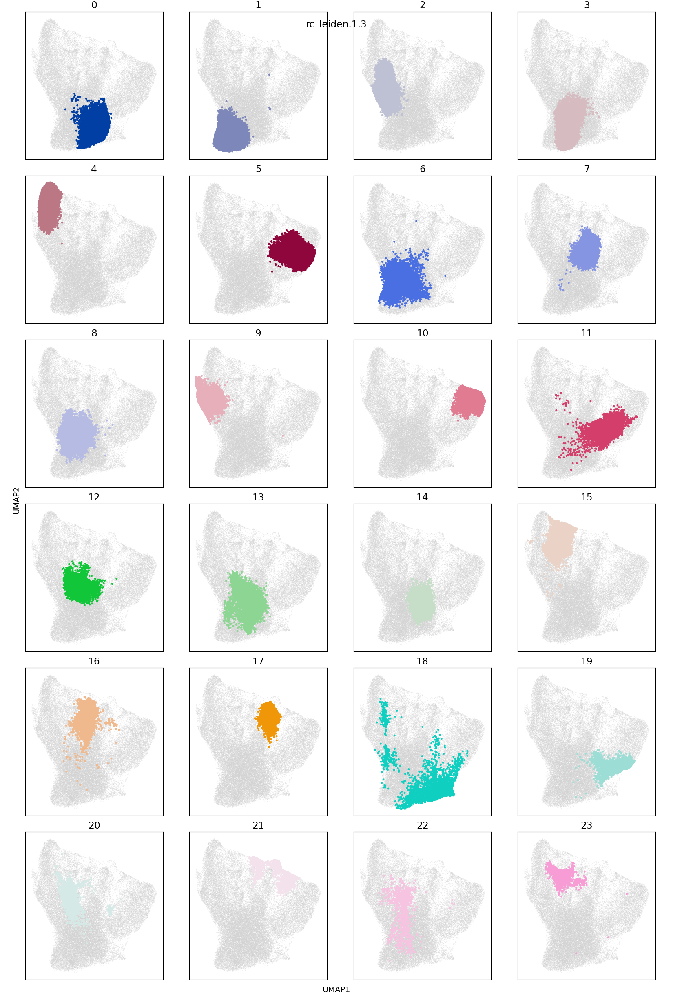

In [29]:
HTML(perma_plot())

In [30]:
%%time
sc.tl.draw_graph(data, n_jobs=3)

CPU times: user 53min 18s, sys: 1min 12s, total: 54min 31s
Wall time: 54min 17s


In [31]:
%%time
sc.write('20210920_COMBO10_Seurat_SCT_reclustered_DR', data)

CPU times: user 2min 39s, sys: 9.04 s, total: 2min 48s
Wall time: 2min 47s


## Additional round of filtering and re-clustering

---

In [7]:
now = datetime.now()
prefix = now.strftime('%Y%m%d')
print(prefix)

20210920


In [8]:
data = sc.read('20210920_COMBO10_Seurat_SCT_reclustered_DR')

In [9]:
output_path='./output/marker_genes/02/'

In [13]:
basename = '_COMBO10_SCT_WRS_rc_leiden_1_3_'

In [14]:
%%time
bundled_DEx_shenanigans(adata=data, 
                        group='rc_leiden.1.3', 
                        key='DEx',
                        bname=basename, 
                        outpath=output_path,
                        n_top_markers=100)

CPU times: user 1h 12min 34s, sys: 12min 9s, total: 1h 24min 44s
Wall time: 1h 24min 55s


Part 1

---

In [7]:
data = sc.read('20210920_COMBO10_Seurat_SCT_reclustered_DR')

#### Cluster 20 was filtered out as a mature cells cluster

In [10]:
data = data[~(data.obs['rc_leiden.1.3'] == '20'), :].copy()

In [12]:
%%time
sc.tl.umap(data)

CPU times: user 1min 29s, sys: 191 ms, total: 1min 30s
Wall time: 1min 30s


In [14]:
sc.pl.umap(data, color='rc_leiden.1.3')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [15]:
axes = plt.gcf().get_axes()

handles, labels = axes[-1].get_legend_handles_labels()
axes[-1].legend(handles, labels)

lgnd = axes[-1].legend(handles, labels, loc=7, scatterpoints=1, 
                       frameon=False, fontsize=8, 
                       bbox_to_anchor=(1.1, 0.5))


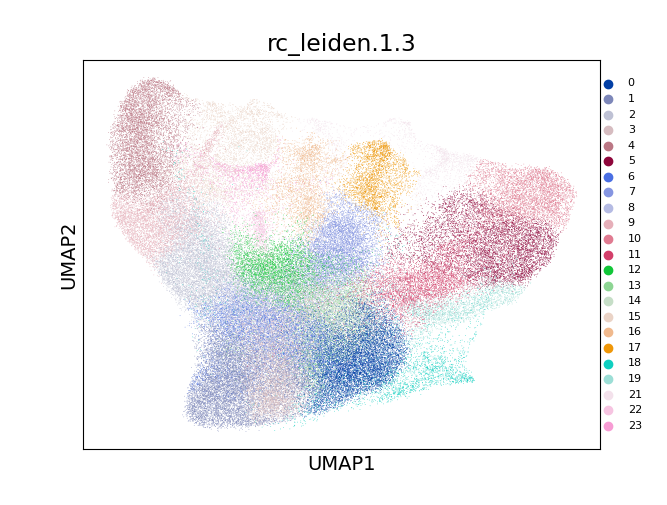

In [16]:
HTML(perma_plot())

#### 2nd re-clustering

In [17]:
sc.tl.leiden(data, resolution=1.0, key_added='s2_leiden.1.0')
sc.tl.leiden(data, resolution=1.1, key_added='s2_leiden.1.1')
sc.tl.leiden(data, resolution=1.2, key_added='s2_leiden.1.2')
sc.tl.leiden(data, resolution=1.3, key_added='s2_leiden.1.3')
sc.tl.leiden(data, resolution=1.4, key_added='s2_leiden.1.4')

In [18]:
sc.pl.umap(data, color='s2_leiden.1.0')
sc.pl.umap(data, color='s2_leiden.1.1')
sc.pl.umap(data, color='s2_leiden.1.2')
sc.pl.umap(data, color='s2_leiden.1.3')
sc.pl.umap(data, color='s2_leiden.1.4')

In [21]:
%%time
sc.tl.leiden(data, resolution=1.4, key_added='s2_leiden.1.4')

CPU times: user 1min 8s, sys: 1.53 s, total: 1min 9s
Wall time: 1min 10s


In [28]:
%%time
sc.write('20210921_COMBO10_Seurat_SCT_SUB2_reclustered_DR', data)

CPU times: user 2min 5s, sys: 4.16 s, total: 2min 10s
Wall time: 2min 10s


#### Resolution 1.3 WAS chosen after 2nd re-clustering

---

In [49]:
plot_segregated_field_plus(data, 's2_leiden.1.4', 's2_leiden.1.4')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

28



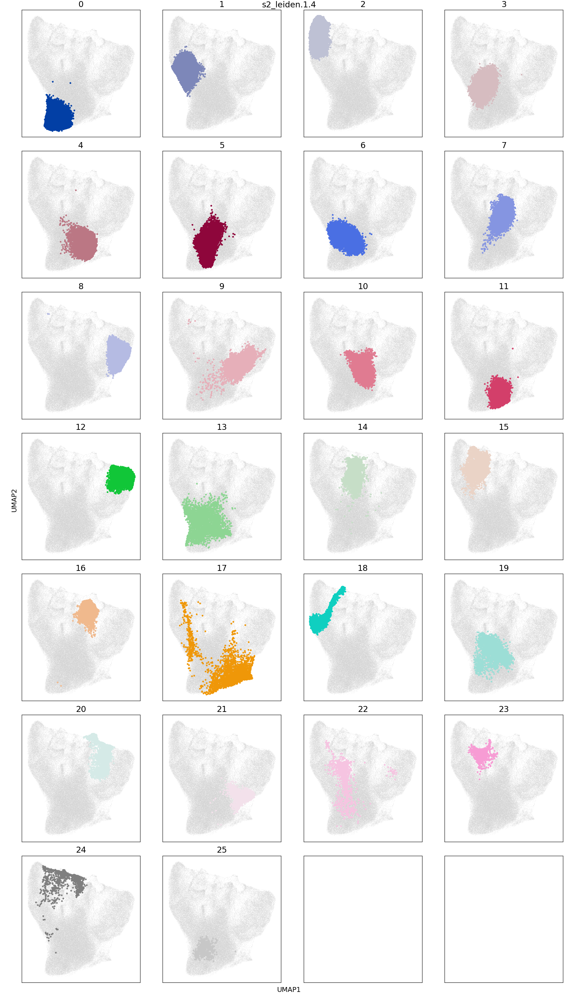

In [50]:
HTML(perma_plot())

---

---

In [64]:
sc.pl.umap(data, color=['s2_leiden.1.0', 's2_leiden.1.1', 's2_leiden.1.2',
                        's2_leiden.1.3', 's2_leiden.1.4', 's2_leiden.1.5'], wspace=0.4, ncols=3)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …


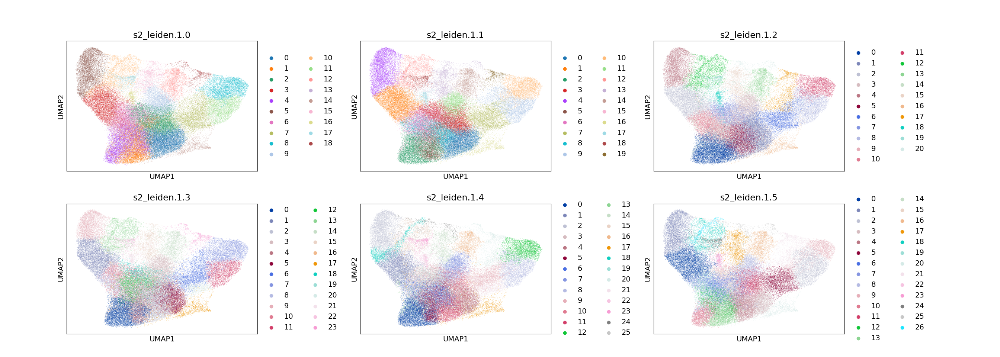

In [65]:
HTML(perma_plot())

Part 2

In [7]:
data = sc.read('20210921_COMBO10_Seurat_SCT_SUB2_reclustered_DR')

In [8]:
output_path='./output/marker_genes/03/'

In [9]:
basename = '_COMBO10_SCT_WRS_s2_leiden_1_4_'

In [13]:
%%time
bundled_DEx_shenanigans(adata=data, 
                        group='s2_leiden.1.4', 
                        key='DEx',
                        bname=basename, 
                        outpath=output_path,
                        n_top_markers=100)

CPU times: user 1h 10min 40s, sys: 12min 38s, total: 1h 23min 18s
Wall time: 1h 23min 30s
